### 步骤1 安装并引入必要的库

In [ ]:
!pip install numpy==1.16.0
!pip install matplotlib==3.1.0
!pip install moviepy==1.0.1
!pip install tensorflow==2.0.0
!pip install opencv-python==4.1.1.26

In [1]:
import matplotlib.pyplot as plt
import cv2
import zipfile
import h5py
import operator
import os, glob
import numpy as np
import moviepy
from moviepy.editor import VideoFileClip
from moviepy.video.io import ImageSequenceClip
from PIL import Image
from tensorflow.keras.applications.imagenet_utils import preprocess_input
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing import image
from IPython.display import HTML

%matplotlib inline
#用于显示高清图像
%config InlineBackend.figure_format = 'retina'

### 步骤2 载入并显示图片数据

In [ ]:
#解压图片数据zip
with zipfile.ZipFile('./test_images.zip') as t: 
    t.extractall() 

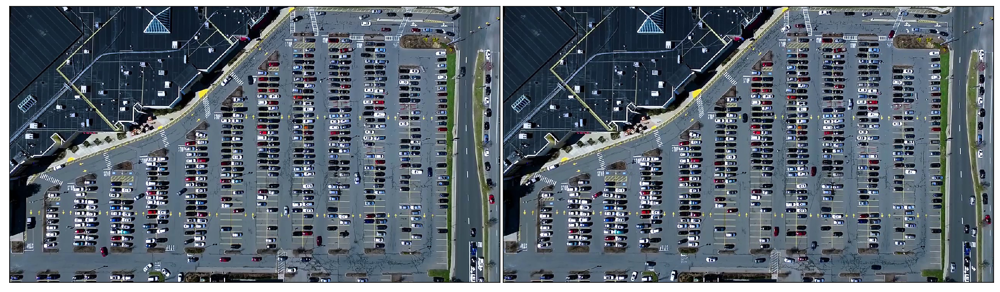

In [2]:
#载入测试图片
test_images = [plt.imread(path) for path in glob.glob('test_images/*.jpg')]
#定义函数显示图片
def show_images(images, cmap=None):
    cols = 2
    rows = (len(images)+1)//cols
    plt.figure(figsize=(15, 12))
    for i, image in enumerate(images):
        plt.subplot(rows, cols, i+1)
        cmap = 'gray' if len(image.shape)==2 else cmap
        plt.imshow(image, cmap=cmap)
        plt.xticks([])
        plt.yticks([])
    plt.tight_layout(pad=0, h_pad=0, w_pad=0)
    plt.show()  
#显示测试图片    
show_images(test_images)   

### 步骤3 定义辅助函数

#### 3.1 定义黄白遮罩函数

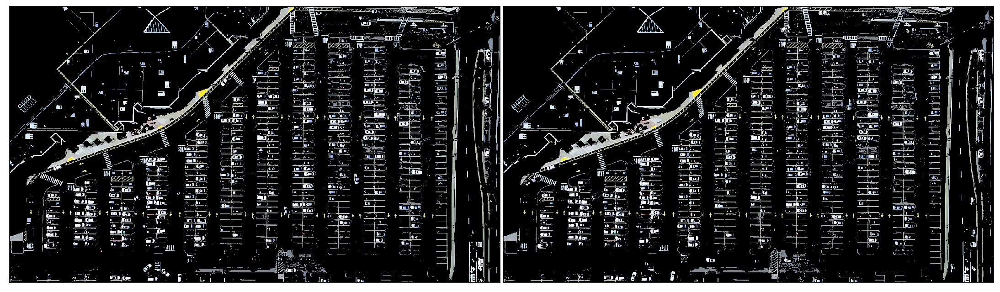

In [3]:
# 请在这里填写您的代码

#先确认图片是rgb模式图片
def select_rgb_white_yellow(image): 
    #添加白色遮罩
    lower = np.uint8([120, 120, 120])
    upper = np.uint8([255, 255, 255])
    white_mask = cv2.inRange(image, lower, upper)
    #添加黄色遮罩
    lower = np.uint8([190, 190,   0])
    upper = np.uint8([255, 255, 255])
    yellow_mask = cv2.inRange(image, lower, upper)
    #合并遮罩
    mask = cv2.bitwise_or(white_mask, yellow_mask)
    masked = cv2.bitwise_and(image, image, mask = mask)
    return masked
#应用函数，显示处理后的图片
white_yellow_images = list(map(select_rgb_white_yellow, test_images))
show_images(white_yellow_images)

#### 3.2 定义灰度图转换及边缘检测函数

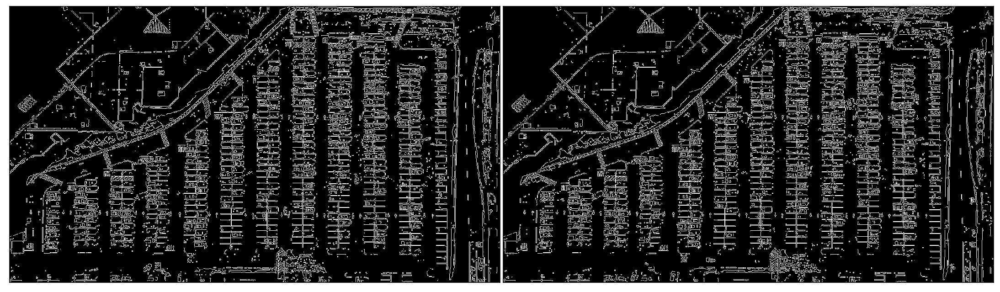

In [4]:
#定义灰度图转换函数
def convert_gray_scale(image):
    return cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

#定义边缘检测函数
def detect_edges(image, low_threshold=50, high_threshold=200):
    return cv2.Canny(image, low_threshold, high_threshold)

#显示转化后图片结果
gray_images = list(map(convert_gray_scale, white_yellow_images))
edge_images = list(map(lambda image: detect_edges(image), gray_images))
show_images(edge_images)

#### 3.3 定义区域遮罩函数

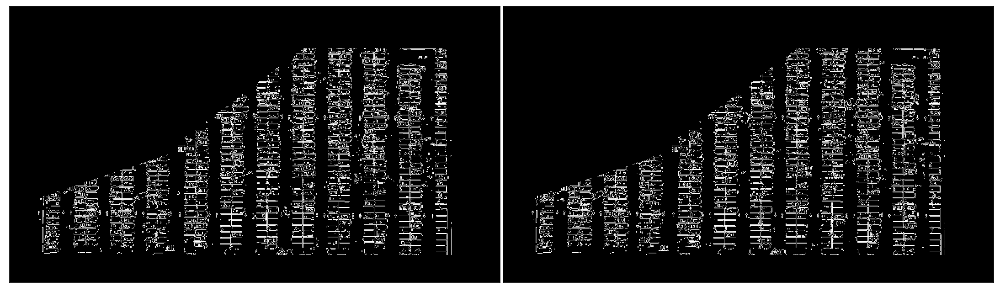

In [5]:
#定义函数，用区域遮罩提取出特定区域
def filter_region(image, vertices):
    mask = np.zeros_like(image)
    if len(mask.shape)==2:
        cv2.fillPoly(mask, vertices, 255)
    else:
        cv2.fillPoly(mask, vertices, (255,)*mask.shape[2]) 
    return cv2.bitwise_and(image, mask)

#定义函数，使得取出的特定区域被包围在五边形中，其他区域显示为黑色
def select_region(image):
    #定义五边形的点
    rows, cols = image.shape[:2]
    pt_1  = [cols*0.05, rows*0.90]
    pt_2 = [cols*0.05, rows*0.70]
    pt_3 = [cols*0.30, rows*0.55]
    pt_4 = [cols*0.6, rows*0.15]
    pt_5 = [cols*0.90, rows*0.15] 
    pt_6 = [cols*0.90, rows*0.90]
    #定义五边形的边
    vertices = np.array([[pt_1, pt_2, pt_3, pt_4, pt_5, pt_6]], dtype=np.int32)
    return filter_region(image, vertices)

#应用函数，并显示处理后图片
roi_images = list(map(select_region, edge_images))
show_images(roi_images)

#### 3.4 定义函数划出横向车位线

 No. lines detected:  569
 No. lines detected:  588


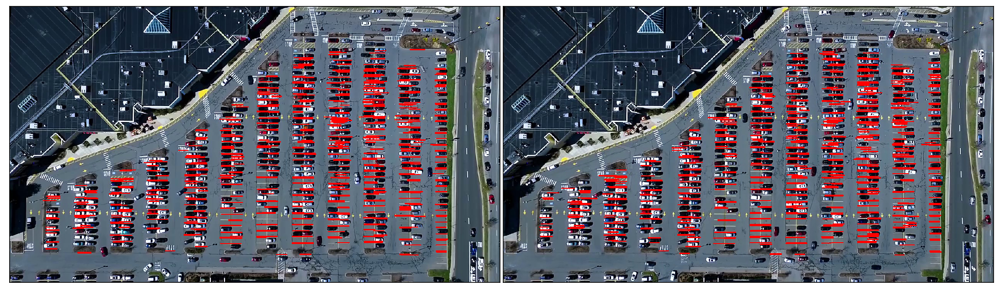

In [6]:
#输入量为canny边缘检测后的结果图
def hough_lines(image):
    return cv2.HoughLinesP(image, rho=0.1, theta=np.pi/10, threshold=15, minLineLength=9, maxLineGap=4)

#应用函数
list_of_lines = list(map(hough_lines, roi_images))

#定义函数划出横向车位线
def draw_lines(image, lines, color=[255, 0, 0], thickness=2, make_copy=True):
    if make_copy:
        #不在原图上做出改动
        image = np.copy(image) 
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 55:
                cleaned.append((x1,y1,x2,y2))
                cv2.line(image, (x1, y1), (x2, y2), color, thickness)
    print(" No. lines detected: ", len(cleaned))
    return image

line_images = []
for image, lines in zip(test_images, list_of_lines):
    line_images.append(draw_lines(image, lines))
#显示划出横向车位线的图
show_images(line_images)

#### 3.5 定义函数划出纵向车位线

In [7]:
def identify_blocks(image, lines, make_copy=True):
    if make_copy:
        new_image = np.copy(image)
    #建立cleaned空列表   
    cleaned = []
    for line in lines:
        for x1,y1,x2,y2 in line:
            if abs(y2-y1) <=1 and abs(x2-x1) >=25 and abs(x2-x1) <= 55:
                cleaned.append((x1,y1,x2,y2))
    #用x1的位置排列cleaned列表
    list1 = sorted(cleaned, key=operator.itemgetter(0, 1))      
    clusters = {}
    dIndex = 0
    clus_dist = 10

    for i in range(len(list1) - 1):
        distance = abs(list1[i+1][0] - list1[i][0])
        if distance <= clus_dist:
            if not dIndex in clusters.keys(): clusters[dIndex] = []
            clusters[dIndex].append(list1[i])
            clusters[dIndex].append(list1[i + 1])
        else:
            dIndex += 1
    #在cluster周围建立坐标系
    rects = {}
    i = 0
    for key in clusters:
        all_list = clusters[key]
        cleaned = list(set(all_list))
        if len(cleaned) > 5:
            cleaned = sorted(cleaned, key=lambda tup: tup[1])
            avg_y1 = cleaned[0][1]
            avg_y2 = cleaned[-1][1]
            avg_x1 = 0
            avg_x2 = 0
            for tup in cleaned:
                avg_x1 += tup[0]
                avg_x2 += tup[2]
            avg_x1 = avg_x1/len(cleaned)
            avg_x2 = avg_x2/len(cleaned)
            rects[i] = (avg_x1, avg_y1, avg_x2, avg_y2)
            i += 1

    print("Num Parking Lanes: ", len(rects))
    #在输入图像上划出车列长方形
    buff = 7
    for key in rects:
        tup_topLeft = (int(rects[key][0] - buff), int(rects[key][1]))
        tup_botRight = (int(rects[key][2] + buff), int(rects[key][3]))
        cv2.rectangle(new_image, tup_topLeft,tup_botRight,(0,255,0),3)
    return new_image, rects

Num Parking Lanes:  12
Num Parking Lanes:  12


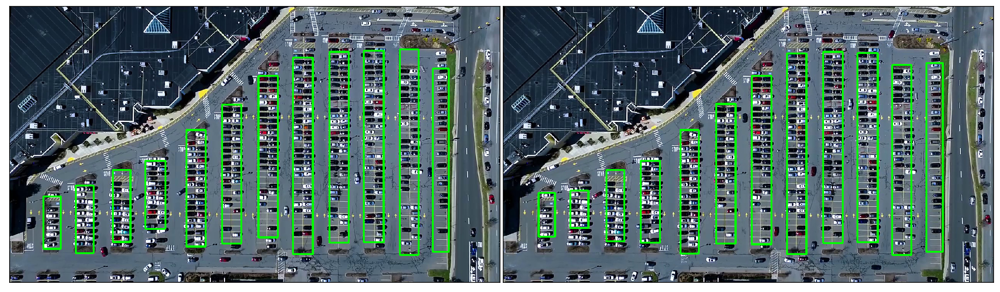

In [8]:
#显示划出车列的结果
rect_images = []
rect_coords = []
for image, lines in zip(test_images, list_of_lines):
    new_image, rects = identify_blocks(image, lines)
    rect_images.append(new_image)
    rect_coords.append(rects)
show_images(rect_images)

### 步骤4 可视化车位划分图

total parking spaces:  551 550
total parking spaces:  545 544


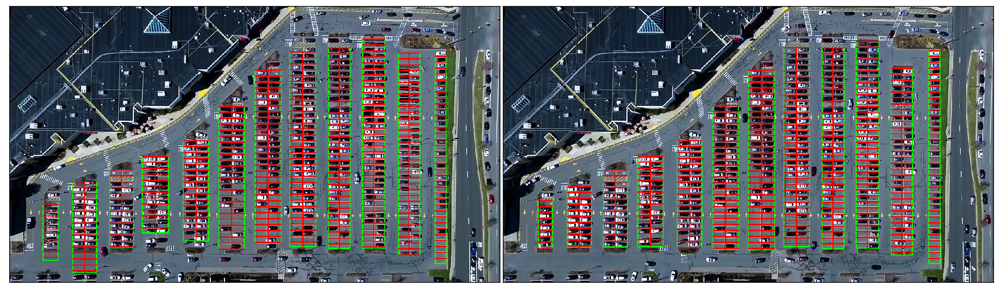

In [9]:
#定义函数划分车位
def draw_parking(image, rects, make_copy = True, color=[255, 0, 0], thickness=2, save = True):
    if make_copy:
        new_image = np.copy(image)
    gap = 15.5
    #建立车位位置词典
    spot_dict = {} 
    tot_spots = 0
    adj_y1 = {0: 20, 1:-10, 2:0, 3:-11, 4:28, 5:5, 6:-15, 7:-15, 8:-10, 9:-30, 10:9, 11:-32}
    adj_y2 = {0: 30, 1: 50, 2:15, 3:10, 4:-15, 5:15, 6:15, 7:-20, 8:15, 9:15, 10:0, 11:30}
    adj_x1 = {0: -8, 1:-15, 2:-15, 3:-15, 4:-15, 5:-15, 6:-15, 7:-15, 8:-10, 9:-10, 10:-10, 11:0}
    adj_x2 = {0: 0, 1: 15, 2:15, 3:15, 4:15, 5:15, 6:15, 7:15, 8:10, 9:10, 10:10, 11:0}
    for key in rects:
        tup = rects[key]
        x1 = int(tup[0]+ adj_x1[key])
        x2 = int(tup[2]+ adj_x2[key])
        y1 = int(tup[1] + adj_y1[key])
        y2 = int(tup[3] + adj_y2[key])
        cv2.rectangle(new_image, (x1, y1),(x2,y2),(0,255,0),2)
        num_splits = int(abs(y2-y1)//gap)
        for i in range(0, num_splits+1):
            y = int(y1 + i*gap)
            cv2.line(new_image, (x1, y), (x2, y), color, thickness)
        if key > 0 and key < len(rects) -1 :        
            x = int((x1 + x2)/2)
            cv2.line(new_image, (x, y1), (x, y2), color, thickness)
        if key == 0 or key == (len(rects) -1):
            tot_spots += num_splits +1
        else:
            tot_spots += 2*(num_splits +1)

        if key == 0 or key == (len(rects) -1):
            for i in range(0, num_splits+1):
                cur_len = len(spot_dict)
                y = int(y1 + i*gap)
                spot_dict[(x1, y, x2, y+gap)] = cur_len +1        
        else:
            for i in range(0, num_splits+1):
                cur_len = len(spot_dict)
                y = int(y1 + i*gap)
                x = int((x1 + x2)/2)
                spot_dict[(x1, y, x, y+gap)] = cur_len +1
                spot_dict[(x, y, x2, y+gap)] = cur_len +2   

    print("total parking spaces: ", tot_spots, cur_len)
    return new_image, spot_dict

delineated = []
spot_pos = []
for image, rects in zip(test_images, rect_coords):
    new_image, spot_dict = draw_parking(image, rects)
    delineated.append(new_image)
    spot_pos.append(spot_dict)

#显示划分车位后的测试图    
show_images(delineated)

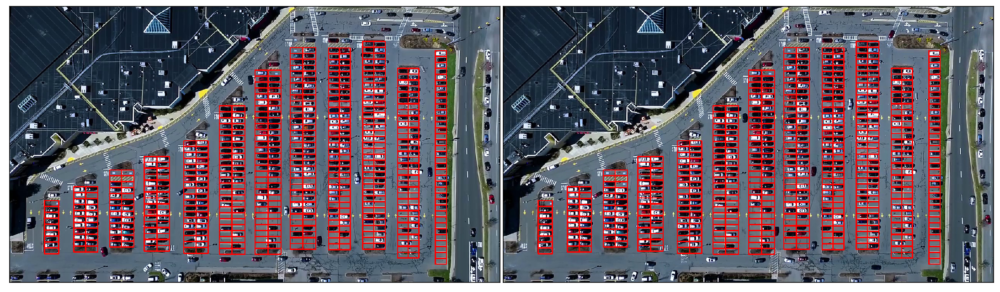

In [10]:
#定义车位词典
final_spot_dict = spot_pos[1]
#定义函数添加车位遮罩
def assign_spots_map(image, spot_dict=final_spot_dict, make_copy = True, color=[255, 0, 0], thickness=2):
    if make_copy:
        new_image = np.copy(image)
    for spot in spot_dict.keys():
        (x1, y1, x2, y2) = spot
        cv2.rectangle(new_image, (int(x1),int(y1)), (int(x2),int(y2)), color, thickness)
    return new_image
#显示结果
marked_spot_images = list(map(assign_spots_map, test_images))
show_images(marked_spot_images)

### 步骤5 实景预测与统计

#### 5.1 加载预训练模型

这一步中，我们读取训练完成并保存的模型，并用这个模型来对测试图片的车位情况进行预测。

In [13]:
#读取预训练的model1.hdf5
top_model_weights_path = 'model_cnn.hdf5'
model = load_model(top_model_weights_path)
#建立空位/非空位词典
class_dictionary = {}
class_dictionary[0] = 'empty'
class_dictionary[1] = 'occupied'

In [14]:
def make_prediction(image):
    #重新调节图像
    img = image/255.
    #转化为四维张量
    image = np.expand_dims(img, axis=0)
    #用预训练模型进行预测
    class_predicted = model.predict(image)
    inID = np.argmax(class_predicted[0])
    label = class_dictionary[inID]
    return label

#### 5.2 在图片上进行预测与统计

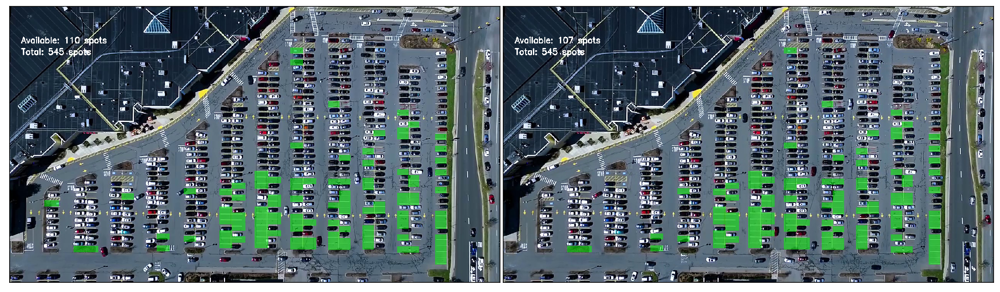

In [15]:
def predict_on_image(image, spot_dict = final_spot_dict, make_copy=True, color = [0, 255, 0], alpha=0.5):
    if make_copy:
        new_image = np.copy(image)
        overlay = np.copy(image)
    cnt_empty = 0
    all_spots = 0
    for spot in spot_dict.keys():
        all_spots += 1
        (x1, y1, x2, y2) = spot
        (x1, y1, x2, y2) = (int(x1), int(y1), int(x2), int(y2))
        #重新调整图片尺寸
        spot_img = image[y1:y2, x1:x2]
        spot_img = cv2.resize(spot_img, (48, 48)) 

        label = make_prediction(spot_img)
        if label == 'empty':
            cv2.rectangle(overlay, (int(x1),int(y1)), (int(x2),int(y2)), color, -1)
            cnt_empty += 1

    cv2.addWeighted(overlay, alpha, new_image, 1 - alpha, 0, new_image)

    cv2.putText(new_image, "Available: %d spots" %cnt_empty, (30, 95),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)

    cv2.putText(new_image, "Total: %d spots" %all_spots, (30, 125),
    cv2.FONT_HERSHEY_SIMPLEX,
    0.7, (255, 255, 255), 2)
    save = False

    return new_image

#需要1分钟左右运行:)
predicted_images = list(map(predict_on_image, test_images))
show_images(predicted_images)

#### 5.3 在视频上进行预测与统计

这一步中，我们将在一段16秒的视频里应用训练好的模型，来对视频里的车位情况进行实时分析与统计。

In [16]:
#显示原视频
HTML("""
<video width="960" height="480" controls>
  <source src="parking16s.mp4" type="video/mp4">
</video>
""")

In [ ]:
#解压图片数据zip
with zipfile.ZipFile('./output.zip') as o: 
    o.extractall() 

In [17]:
#定义函数将图片转为视频
def pics2video(frames_dir, video_dst, name, fps):
    frames_name = os.listdir(frames_dir)
    frames_name = sorted(frames_name,key=lambda x:int(x[5:-4]))    
    frames_path = [frames_dir+frame_name for frame_name in frames_name]
    clip = ImageSequenceClip.ImageSequenceClip(frames_path, fps=fps)
    clip.write_videofile(video_dst+'{}.mp4'.format(name))

In [18]:
#显示处理完成的视频
#可在左上角看到显示的车位数据
pics2video('./output/','./','video_output',7)
from IPython.display import HTML
HTML("""
<video width="960" height="480" controls>
  <source src="./video_output.mp4" type="video/mp4">
</video>
""")

t:   4%|▎         | 3/81 [00:00<00:02, 26.74it/s, now=None]

Moviepy - Building video ./video_output.mp4.
Moviepy - Writing video ./video_output.mp4



Moviepy - Done !
Moviepy - video ready ./video_output.mp4
